This code is referenced from <br>
https://github.com/TannerGilbert/Object-Detection-and-Image-Segmentation-with-Detectron2

In [1]:
%cd detectron2

/home/z890/Documents/ml_sample/detection/d2_MaskRCNN/detectron2


/home/z890/.conda/envs/d2_MaskRCNN/lib/python3.10/site-packages/IPython/core/magics/osm.py:417: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


## Download a demo dataset

In [2]:
import torch, detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import matplotlib.pyplot as plt

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In this case we will use a dataset with balloon images.

In [3]:
# write a function that loads the dataset into detectron2's standard format
import os
import numpy as np
import json
from detectron2.structures import BoxMode

def get_balloon_dicts(img_dir):
    json_file = os.path.join(img_dir, "via_region_data.json")
    with open(json_file) as f:
        imgs_anns = json.load(f)

    dataset_dicts = []
    for idx, v in enumerate(imgs_anns.values()):
        record = {}
        
        filename = os.path.join(img_dir, v["filename"])
        height, width = cv2.imread(filename).shape[:2]
        
        record["file_name"] = filename
        record["image_id"] = idx
        record["height"] = height
        record["width"] = width
      
        annos = v["regions"]
        objs = []
        for _, anno in annos.items():
            assert not anno["region_attributes"]
            anno = anno["shape_attributes"]
            px = anno["all_points_x"]
            py = anno["all_points_y"]
            poly = [(x + 0.5, y + 0.5) for x, y in zip(px, py)]
            poly = [p for x in poly for p in x]

            obj = {
                "bbox": [np.min(px), np.min(py), np.max(px), np.max(py)],
                "bbox_mode": BoxMode.XYXY_ABS,
                "segmentation": [poly],
                "category_id": 0, # we have only 1 class == balloon
            }
            objs.append(obj)
        record["annotations"] = objs
        dataset_dicts.append(record)
    return dataset_dicts

In [4]:
# set augmentation
from detectron2.data import detection_utils as utils
import detectron2.data.transforms as T
import copy
import torch

def custom_mapper(dataset_dict):
    dataset_dict = copy.deepcopy(dataset_dict)  # it will be modified by code below
    image = utils.read_image(dataset_dict["file_name"], format="BGR")
    transform_list = [
        #T.Resize((800,600)),
        T.RandomBrightness(0.8, 1.8),
        T.RandomContrast(0.6, 1.3),
        T.RandomSaturation(0.8, 1.4),
        T.RandomRotation(angle=[90, 90]),
        T.RandomLighting(0.7),
        T.RandomFlip(prob=0.4, horizontal=False, vertical=True),
    ]
    image, transforms = T.apply_transform_gens(transform_list, image)
    dataset_dict["image"] = torch.as_tensor(image.transpose(2, 0, 1).astype("float32"))

    annos = [
        utils.transform_instance_annotations(obj, transforms, image.shape[:2])
        for obj in dataset_dict.pop("annotations")
        if obj.get("iscrowd", 0) == 0
    ]
    instances = utils.annotations_to_instances(annos, image.shape[:2])
    dataset_dict["instances"] = utils.filter_empty_instances(instances)
    return dataset_dict

In [5]:
from detectron2.engine import DefaultTrainer
from detectron2.data import build_detection_test_loader, build_detection_train_loader

class CustomTrainer(DefaultTrainer):
    @classmethod
    def build_train_loader(cls, cfg):
        return build_detection_train_loader(cfg, mapper=custom_mapper)

In [6]:
for d in ["train", "val"]:
    DatasetCatalog.register("balloon_" + d, lambda d=d: get_balloon_dicts("../dataset/balloon/" + d))
    MetadataCatalog.get("balloon_" + d).set(thing_classes=["balloon"])
balloon_metadata = MetadataCatalog.get("balloon_train")

You can go to <br>
detectron2/detectron2/model_zoo/model_zoo.py <br>
to choose a model <br>
name "my_yaml" as the location of the yaml <br>
Check <br>
https://github.com/facebookresearch/detectron2/blob/main/MODEL_ZOO.md <br>
for details of models

In [7]:
# e.g.
my_yaml = "COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"

In [8]:
# start training !!
from detectron2.config import get_cfg

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file(my_yaml))
cfg.DATASETS.TRAIN = ("balloon_train",)
cfg.DATASETS.TEST = ()   # no metrics implemented for this dataset
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(my_yaml)  # initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 500
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # faster, and good enough for this toy dataset
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only has one class (balloon)

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = CustomTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[06/02 16:05:39 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f10217.pkl: 178MB [00:04, 38.1MB/s]                              
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (2, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (2,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due t

[06/02 16:05:44 d2.engine.train_loop]: Starting training from iteration 0


/home/z890/.conda/envs/d2_MaskRCNN/lib/python3.10/site-packages/torch/functional.py:554: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /pytorch/aten/src/ATen/native/TensorShape.cpp:4314.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[06/02 16:05:52 d2.utils.events]:  eta: 0:02:43  iter: 19  total_loss: 2.089  loss_cls: 0.6937  loss_box_reg: 0.6187  loss_mask: 0.685  loss_rpn_cls: 0.0198  loss_rpn_loc: 0.01648    time: 0.3057  last_time: 0.3709  data_time: 0.0133  last_data_time: 0.0075   lr: 9.7405e-06  max_mem: 7850M
[06/02 16:05:57 d2.utils.events]:  eta: 0:02:36  iter: 39  total_loss: 1.855  loss_cls: 0.6086  loss_box_reg: 0.5569  loss_mask: 0.6347  loss_rpn_cls: 0.02377  loss_rpn_loc: 0.01328    time: 0.2951  last_time: 0.4435  data_time: 0.0144  last_data_time: 0.0047   lr: 1.9731e-05  max_mem: 7850M
[06/02 16:06:03 d2.utils.events]:  eta: 0:02:28  iter: 59  total_loss: 1.816  loss_cls: 0.5143  loss_box_reg: 0.6372  loss_mask: 0.5526  loss_rpn_cls: 0.01262  loss_rpn_loc: 0.009755    time: 0.2873  last_time: 0.4811  data_time: 0.0183  last_data_time: 0.1287   lr: 2.972e-05  max_mem: 7852M
[06/02 16:06:08 d2.utils.events]:  eta: 0:02:20  iter: 79  total_loss: 1.455  loss_cls: 0.4036  loss_box_reg: 0.5355  loss_

## Inference & evaluation using the trained model
Now, let's run inference with the trained model on the balloon validation dataset. First, let's create a predictor using the model we just trained:

In [9]:
cfg.INPUT.MIN_SIZE_TEST = 0 # if set to zero, we do not resize the image
cfg.INPUT.MAX_SIZE_TEST = 0 # if set to zero, we do not resize the image
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.8  
predictor = DefaultPredictor(cfg)

[06/02 16:09:09 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


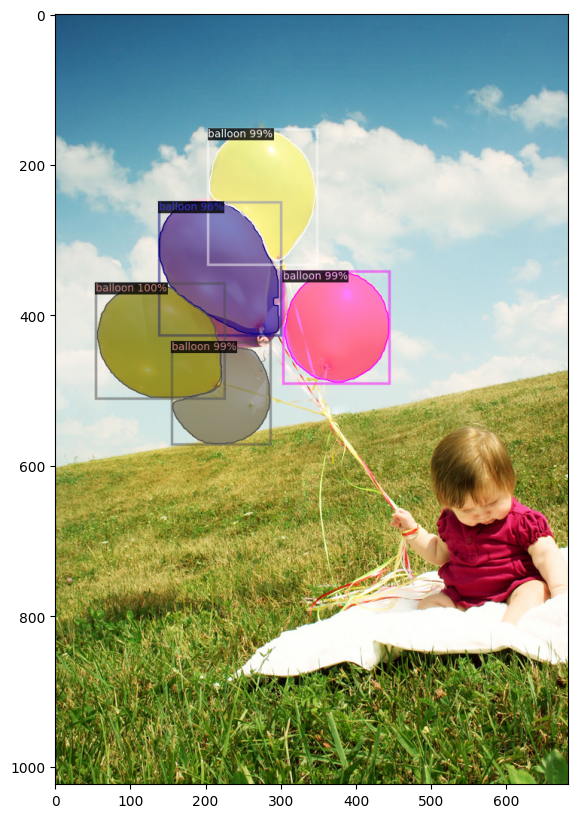

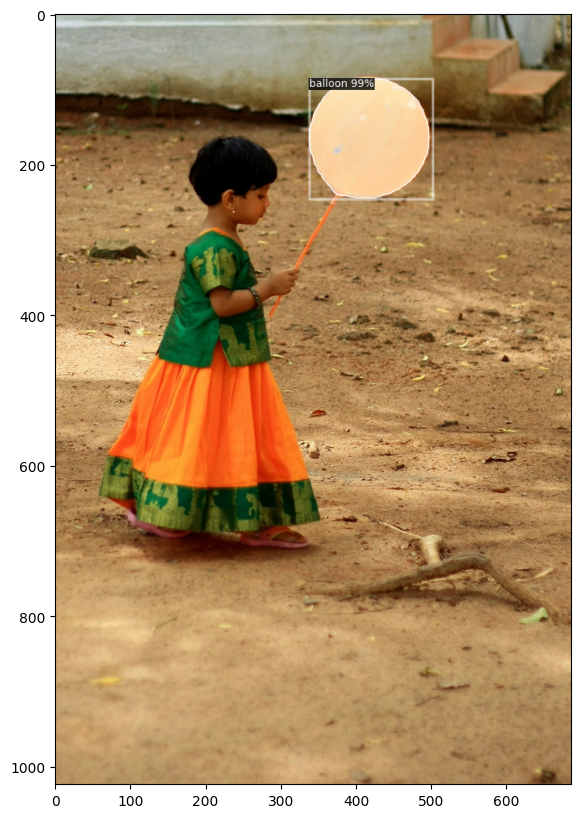

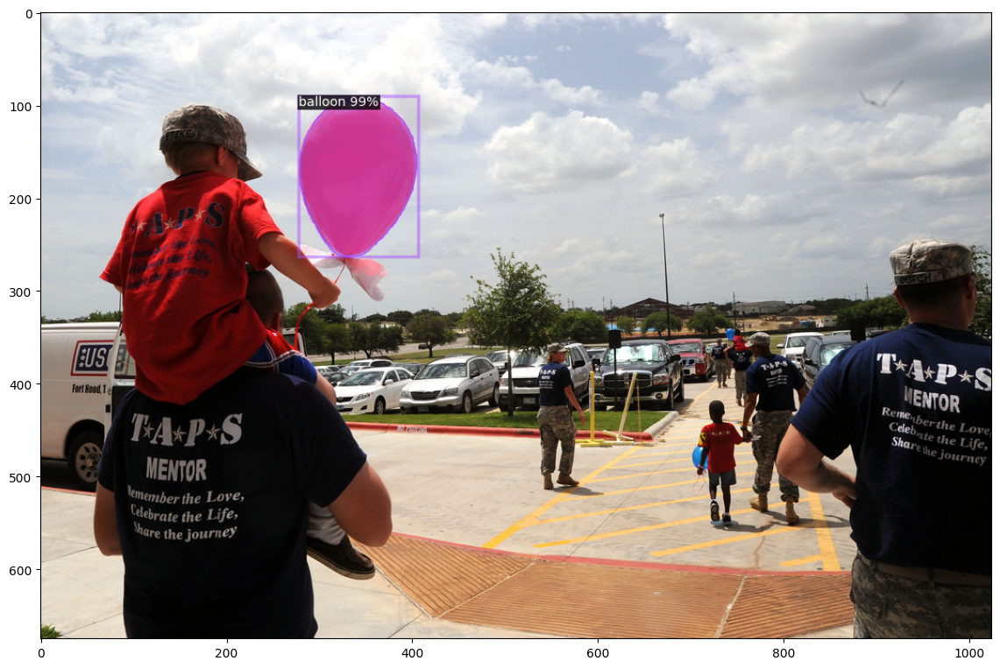

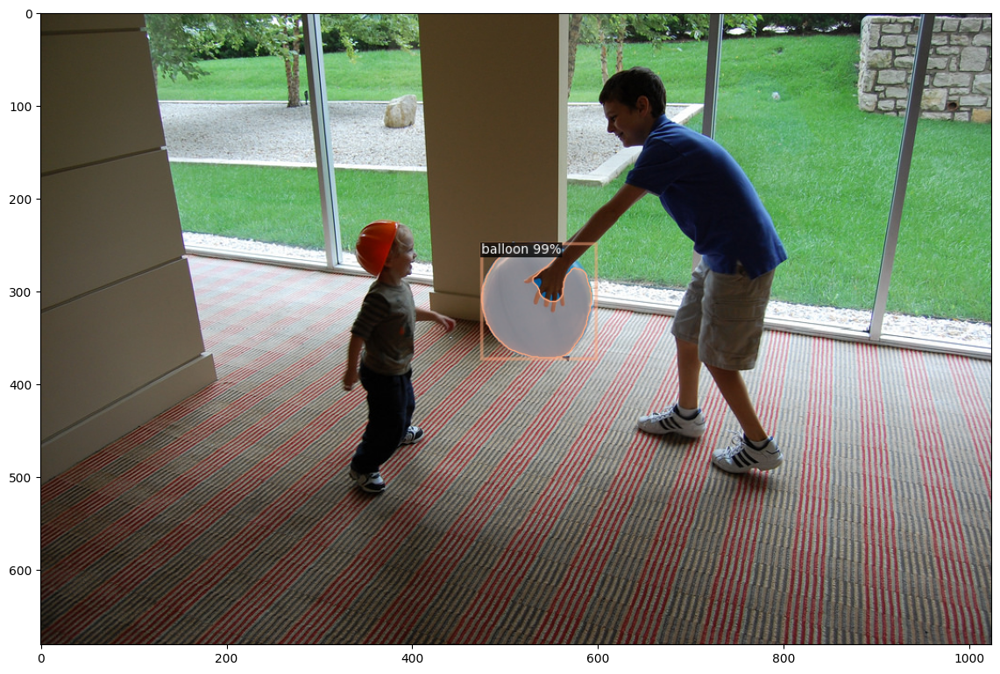

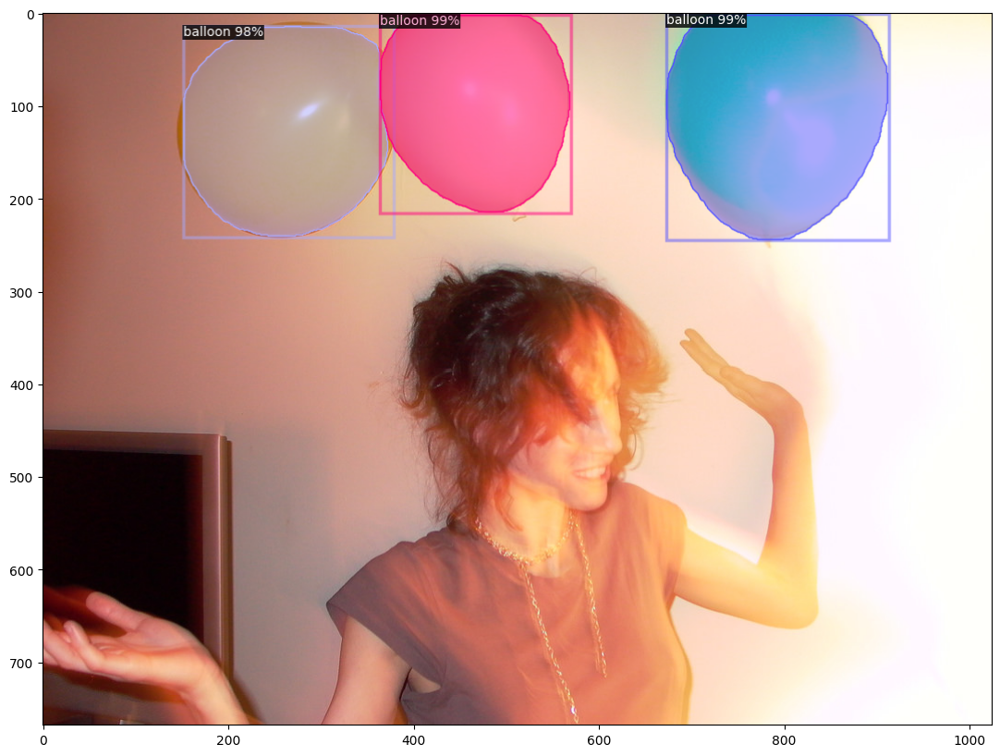

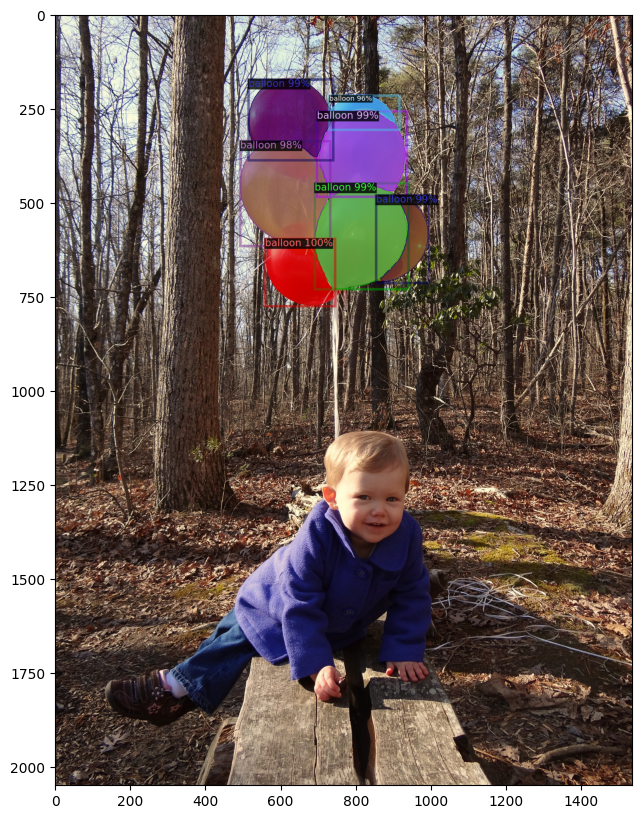

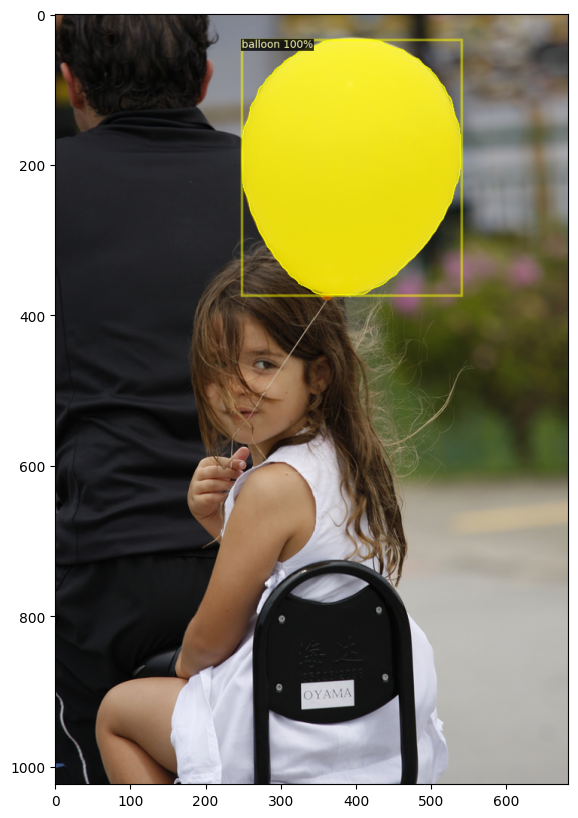

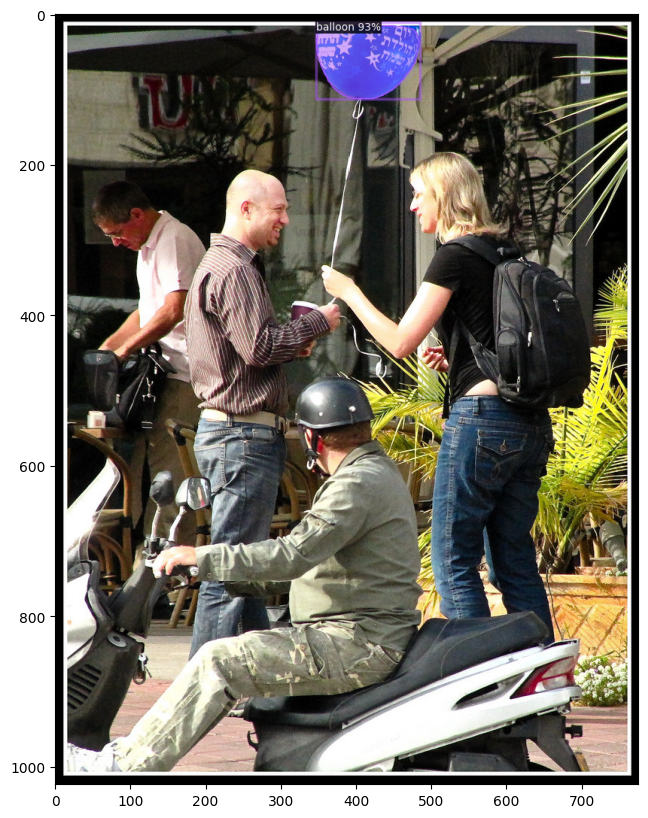

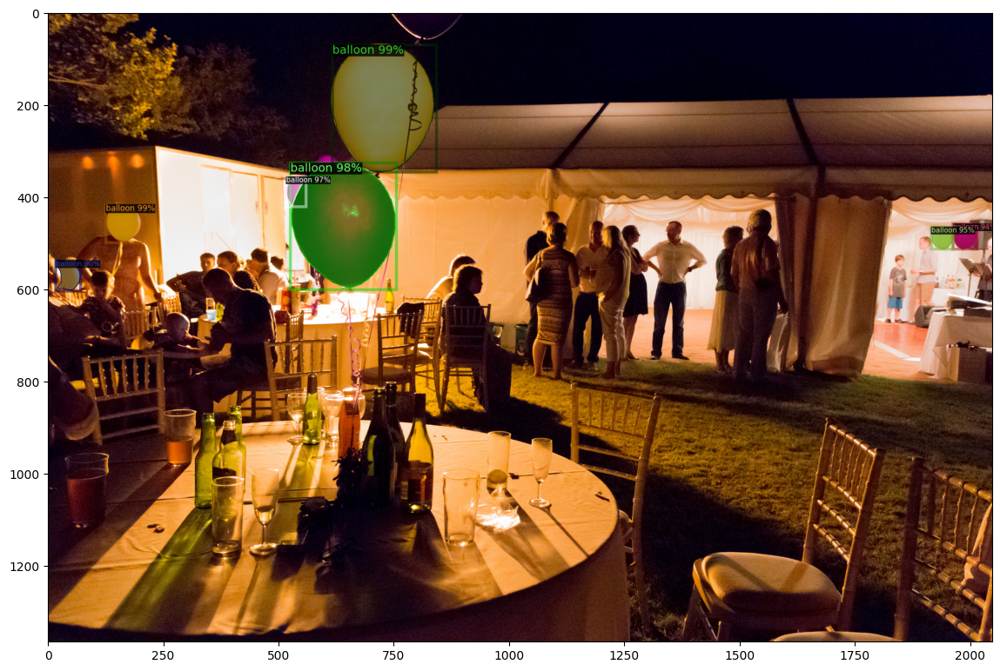

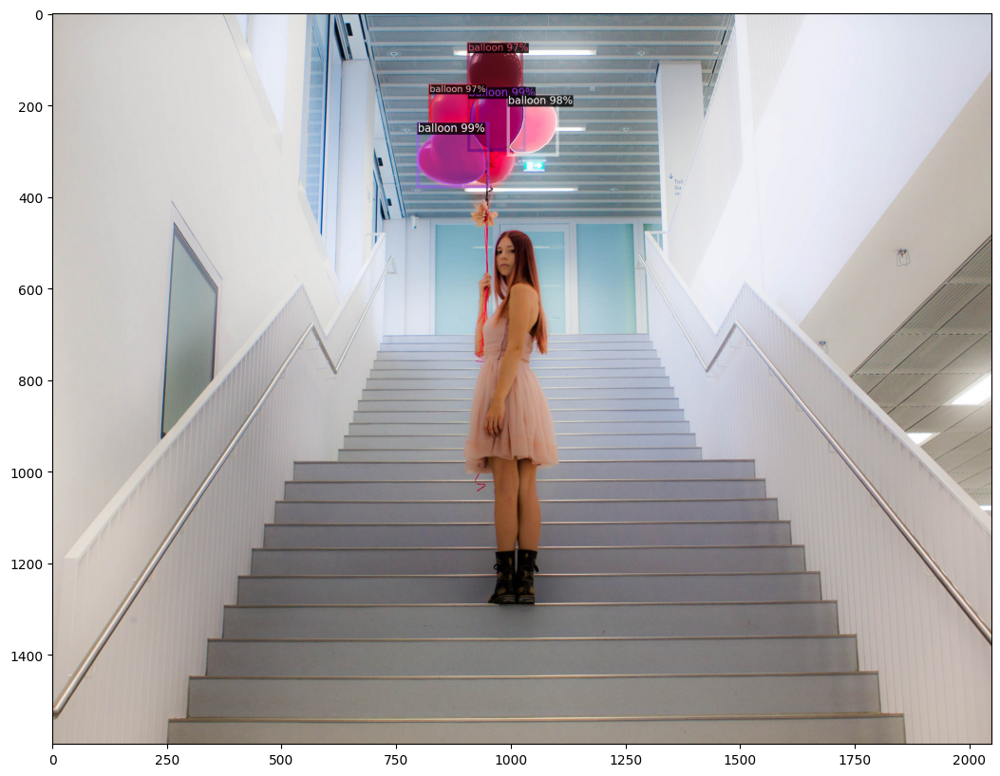

In [11]:
from detectron2.utils.visualizer import ColorMode
import random

dataset_dicts = get_balloon_dicts("../dataset/balloon/val")
for d in random.sample(dataset_dicts, 10):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1], metadata=balloon_metadata, scale=1)
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.figure(figsize = (14, 10))
    plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
    plt.show()

We can also evaluate its performance using AP metric implemented in COCO API.

In [12]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("balloon_val", ("bbox",), False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "balloon_val")
print(inference_on_dataset(trainer.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`

[06/02 16:09:31 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
[06/02 16:09:31 d2.evaluation.coco_evaluation]: Trying to convert 'balloon_val' to COCO format ...
[06/02 16:09:31 d2.data.datasets.coco]: Converting annotations of dataset 'balloon_val' to COCO format ...)
[06/02 16:09:31 d2.data.datasets.coco]: Converting dataset dicts into COCO format
[06/02 16:09:31 d2.data.datasets.coco]: Conversion finished, #images: 13, #annotations: 50
[06/02 16:09:31 d2.data.datasets.coco]: Caching COCO format annotations at './output/balloon_val_coco_format.json' ...
[06/02 16:09:31 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
|  balloon   | 50           |
|            |              |
[06/02 16:09:31 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(0, 0), max_size=0, sample_style='choice')]
[06/02 16:09:3

# Export the model to onnx

In [ ]:
import torch
from detectron2.config import get_cfg
from detectron2.modeling import build_model
from detectron2.checkpoint import DetectionCheckpointer
from detectron2.export import TracingAdapter
from detectron2.data import build_detection_test_loader
from detectron2 import model_zoo
import os
import onnx 
import cv2

my_yaml = "COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"
# Step 1: Load the configuration and model
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file(my_yaml))
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.DEVICE = "cuda"
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.9  # Set threshold for this demo

# Step 2: Create Pytorch Model
model = build_model(cfg)
DetectionCheckpointer(model).load(cfg.MODEL.WEIGHTS)
model.eval()

# Step 3: Trace the model with appropriate inputs
#im can be any image of your training/validation dataset 
im = cv2.imread("../dataset/balloon/val/14898532020_ba6199dd22_k.jpg")
im_torch = torch.as_tensor(im.astype("float32").transpose(2, 0, 1))
inputs = [{"image": im_torch}]

traceable_model = TracingAdapter(model, inputs, None)

# Step 4: Export to ONNX with appropriate dynamic axes
torch.onnx.export(traceable_model, (im_torch,), 
                  "./output/model.onnx", 
                  opset_version=16,
                  input_names = ['image'],
                  output_names = ['instances'],
                  dynamic_axes={'image' : {1 : 'height', 2: 'width'},
                                'instances' : {0 : 'batch_size'}}
                                )

[06/02 16:10:03 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


/home/z890/Documents/ml_sample/detection/d2_MaskRCNN/detectron2/detectron2/structures/image_list.py:86: TracerWarning: Converting a tensor to a Python boolean might cause the trace to be incorrect. We can't record the data flow of Python values, so this value will be treated as a constant in the future. This means that the trace might not generalize to other inputs!
  assert t.shape[:-2] == tensors[0].shape[:-2], t.shape
/home/z890/Documents/ml_sample/detection/d2_MaskRCNN/detectron2/detectron2/structures/boxes.py:151: TracerWarning: Converting a tensor to a Python boolean might cause the trace to be incorrect. We can't record the data flow of Python values, so this value will be treated as a constant in the future. This means that the trace might not generalize to other inputs!
  if tensor.numel() == 0:
/home/z890/Documents/ml_sample/detection/d2_MaskRCNN/detectron2/detectron2/structures/boxes.py:155: TracerWarning: Converting a tensor to a Python boolean might cause the trace to be i

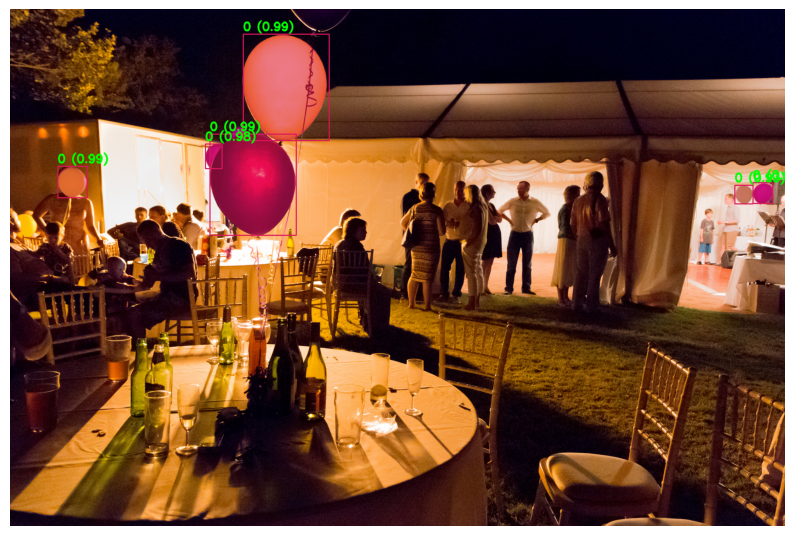

In [15]:
import cv2
import numpy as np
import onnxruntime as ort
import matplotlib.pyplot as plt

# Create an ONNX Runtime session
session = ort.InferenceSession("./output/model.onnx")

# Load image
im = cv2.imread("../dataset/balloon/val/14898532020_ba6199dd22_k.jpg")
im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)

# Run inference
outputs = session.run(None, {"image": im.astype("float32").transpose(2, 0, 1)})

# Get the outputs
#boxes, scores, classes, masks = outputs
boxes, classes, masks, scores,_  = outputs

# Create a list of random colors for each class
num_classes = len(np.unique(classes))  # Assuming classes are 0-indexed
colors = np.random.randint(0, 255, size=(num_classes, 3))


# Process each mask
for i in range(len(classes)):
    score = scores[i]
    class_id = int(classes[i])
    color = colors[class_id]
    mask = masks[i]

    # Create colored mask
    colored_mask = np.zeros_like(im)
    colored_mask[mask] = color

    # Add colored mask to overlay with transparency
    alpha = 0.5  # Transparency factor
    im = np.where(colored_mask != 0, 
                      cv2.addWeighted(im, 1 - alpha, colored_mask, alpha, 0),
                      im)

    # Draw bounding box and label
    box = boxes[i]
    x_min, y_min, x_max, y_max = box
    cv2.rectangle(im, (int(x_min), int(y_min)), (int(x_max), int(y_max)), 
                 color.tolist(), 2)
    cv2.putText(im, f'{class_id} ({score:.2f})', 
               (int(x_min), int(y_min - 10)),
               cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 3)

# Display the result
plt.figure(figsize=(10, 10))
plt.imshow(im)
plt.axis('off')
plt.show()